<a href="https://colab.research.google.com/github/Teganmosi/Image-generation-using-GAN/blob/main/image_generation_using_gan.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import tensorflow.compat.v1 as tf
tf.disable_v2_behavior()

import os
import io
import IPython.display
import numpy as np
import PIL.Image
from scipy.stats import truncnorm
import tensorflow_hub as hub

Instructions for updating:
non-resource variables are not supported in the long term


In [2]:
# module_path = '/kaggle/input/biggan/tensorflow1/512/1'
module_path = 'https://www.kaggle.com/models/deepmind/biggan/frameworks/TensorFlow1/variations/512/versions/1'

tf.reset_default_graph()
print('Loading BigGAN module from:', module_path)
module = hub.Module(module_path)
inputs = {k: tf.placeholder(v.dtype, v.get_shape().as_list(), k)
          for k, v in module.get_input_info_dict().items()}
output = module(inputs)

print()
print('Inputs:\n', '\n'.join(
    '  {}: {}'.format(*kv) for kv in inputs.items()))
print()
print('Output:', output)

input_z = inputs['z']
input_y = inputs['y']
input_trunc = inputs['truncation']

dim_z = input_z.shape.as_list()[1]
vocab_size = input_y.shape.as_list()[1]

def truncated_z_sample(batch_size, truncation=1., seed=None):
    state = None if seed is None else np.random.RandomState(seed)
    values = truncnorm.rvs(-2, 2, size=(batch_size, dim_z), random_state=state)
    return truncation * values

def one_hot(index, vocab_size=vocab_size):
    index = np.asarray(index)
    if len(index.shape) == 0:
        index = np.asarray([index])
    assert len(index.shape) == 1
    num = index.shape[0]
    output = np.zeros((num, vocab_size), dtype=np.float32)
    output[np.arange(num), index] = 1
    return output

def one_hot_if_needed(label, vocab_size=vocab_size):
    label = np.asarray(label)
    if len(label.shape) <= 1:
        label = one_hot(label, vocab_size)
    assert len(label.shape) == 2
    return label

def sample(sess, noise, label, truncation=1., batch_size=8,
           vocab_size=vocab_size):
    noise = np.asarray(noise)
    label = np.asarray(label)
    num = noise.shape[0]
    if len(label.shape) == 0:
        label = np.asarray([label] * num)
    if label.shape[0] != num:
        raise ValueError('Got # noise samples ({}) != # label samples ({})'
                         .format(noise.shape[0], label.shape[0]))
    label = one_hot_if_needed(label, vocab_size)
    ims = []
    for batch_start in range(0, num, batch_size):
        s = slice(batch_start, min(num, batch_start + batch_size))
        feed_dict = {input_z: noise[s], input_y: label[s], input_trunc: truncation}
        ims.append(sess.run(output, feed_dict=feed_dict))
    ims = np.concatenate(ims, axis=0)
    assert ims.shape[0] == num
    ims = np.clip(((ims + 1) / 2.0) * 256, 0, 255)
    ims = np.uint8(ims)
    return ims

def interpolate(A, B, num_interps):
    if A.shape != B.shape:
        raise ValueError('A and B must have the same shape to interpolate.')
    alphas = np.linspace(0, 1, num_interps)
    return np.array([(1-a)*A + a*B for a in alphas])

def imgrid(imarray, cols=5, pad=1):
    if imarray.dtype != np.uint8:
        raise ValueError('imgrid input imarray must be uint8')
    pad = int(pad)
    assert pad >= 0
    cols = int(cols)
    assert cols >= 1
    N, H, W, C = imarray.shape
    rows = N // cols + int(N % cols != 0)
    batch_pad = rows * cols - N
    assert batch_pad >= 0
    post_pad = [batch_pad, pad, pad, 0]
    pad_arg = [[0, p] for p in post_pad]
    imarray = np.pad(imarray, pad_arg, 'constant', constant_values=255)
    H += pad
    W += pad
    grid = (imarray
            .reshape(rows, cols, H, W, C)
            .transpose(0, 2, 1, 3, 4)
            .reshape(rows*H, cols*W, C))
    if pad:
        grid = grid[:-pad, :-pad]
    return grid

def imshow(a, format='png', jpeg_fallback=True):
    a = np.asarray(a, dtype=np.uint8)
    data = io.BytesIO()
    PIL.Image.fromarray(a).save(data, format)
    im_data = data.getvalue()
    try:
        disp = IPython.display.display(IPython.display.Image(im_data))
    except IOError:
        if jpeg_fallback and format != 'jpeg':
            print(('Warning: image was too large to display in format "{}"; '
               'trying jpeg instead.').format(format))
        return imshow(a, format='jpeg')
    else:
        pass
    return disp

initializer = tf.global_variables_initializer()
sess = tf.Session()
sess.run(initializer)

Loading BigGAN module from: https://www.kaggle.com/models/deepmind/biggan/frameworks/TensorFlow1/variations/512/versions/1

Inputs:
   z: Tensor("z:0", shape=(?, 128), dtype=float32)
  y: Tensor("y:0", shape=(?, 1000), dtype=float32)
  truncation: Tensor("truncation:0", shape=(), dtype=float32)

Output: Tensor("module_apply_default/G_trunc_output:0", shape=(?, 512, 512, 3), dtype=float32)


In [3]:
def GAN_1(category:str):
    num_samples = 10 #@param {type:"slider", min:1, max:20, step:1}
    truncation = 0.4 #@param {type:"slider", min:0.02, max:1, step:0.02}
    noise_seed = 0 #@param {type:"slider", min:0, max:100, step:1}

    z = truncated_z_sample(num_samples, truncation, noise_seed)
    y = int(category.split(')')[0])

    ims = sample(sess, z, y, truncation=truncation)
    imshow(imgrid(ims, cols=min(num_samples, 5)))

def GAN_2(category_A:str, category_B:str):
    num_samples = 2 #@param {type:"slider", min:1, max:5, step:1}
    num_interps = 5 #@param {type:"slider", min:2, max:10, step:1}
    truncation = 0.2 #@param {type:"slider", min:0.02, max:1, step:0.02}
    noise_seed_A = 0 #@param {type:"slider", min:0, max:100, step:1}
    noise_seed_B = 0 #@param {type:"slider", min:0, max:100, step:1}
    def interpolate_and_shape(A, B, num_interps):
        interps = interpolate(A, B, num_interps)
        return (interps.transpose(1, 0, *range(2, len(interps.shape)))
                     .reshape(num_samples * num_interps, *interps.shape[2:]))

    z_A, z_B = [truncated_z_sample(num_samples, truncation, noise_seed)
                for noise_seed in [noise_seed_A, noise_seed_B]]
    y_A, y_B = [one_hot([int(category.split(')')[0])] * num_samples)
                for category in [category_A, category_B]]

    z_interp = interpolate_and_shape(z_A, z_B, num_interps)
    y_interp = interpolate_and_shape(y_A, y_B, num_interps)

    ims = sample(sess, z_interp, y_interp, truncation=truncation)
    imshow(imgrid(ims, cols=num_interps))

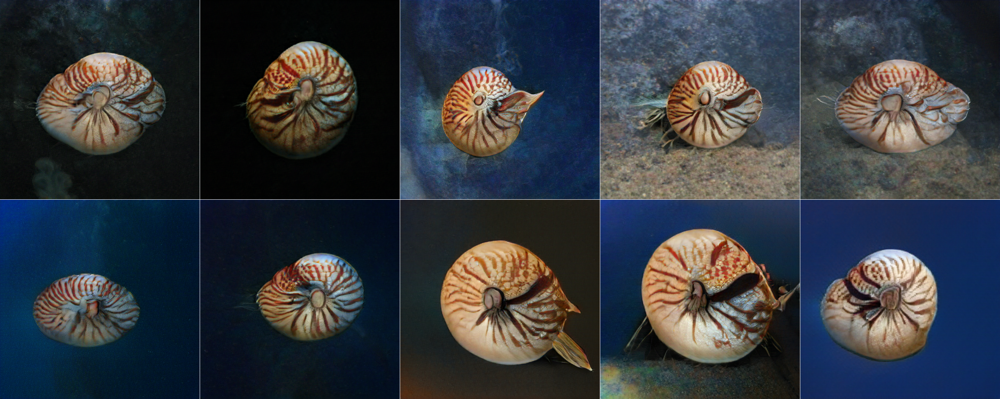

In [4]:
GAN_1("117) chambered nautilus, pearly nautilus, nautilus")

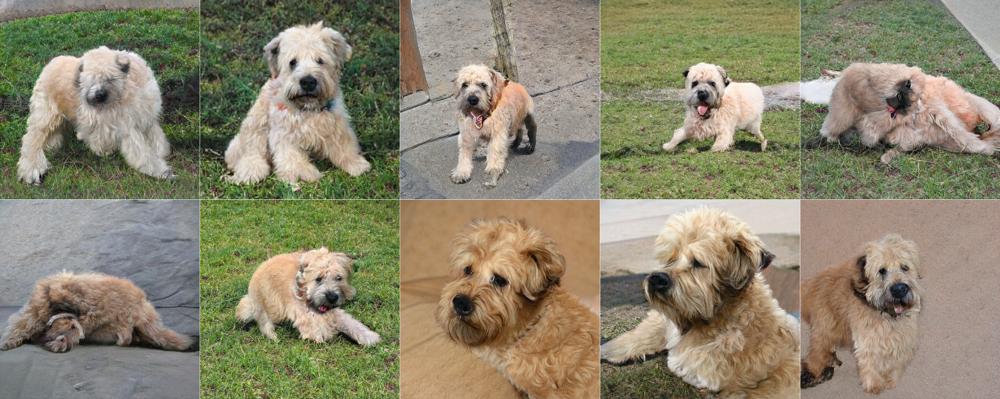

In [5]:
GAN_1("202) soft-coated wheaten terrier")

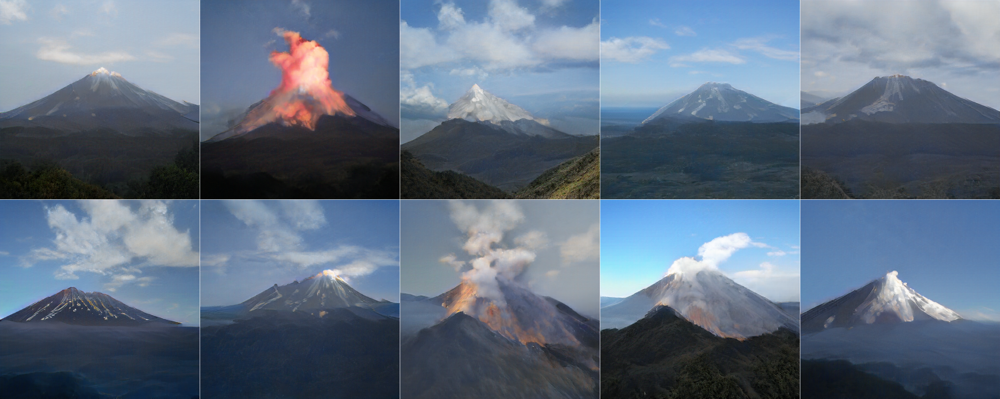

In [6]:
GAN_1("980) volcano")